## detecte the pupil

To detect the pupil, I use an image of a protoypical eye (mainly of the iris), but you may need to use yours. It's simple, let's start with mine, grab some frames of your head, detct your eyes, then take the average of the (best) detected images of your iris.


In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
np.set_printoptions(precision=2, suppress=True)
# define plots to be inserted interactively
import matplotlib.pyplot as plt
%matplotlib inline
import cv2

Let's grab some frames. During that time, I recommend to:
- not move the head (I hold them in my hands) and to look at the led of your webcam,
- when it's lit, move your eyes evenly on the screen (try to avoid moving eyebrows or to do sacaddes).

In [2]:
from LeCheapEyeTracker import LeCheapEyeTracker
N_frame = 64
cam = LeCheapEyeTracker()
import time
time.sleep(1.)
img0 = cam.grab()
H, W, three = img0.shape
movie = np.zeros((H, W, 3, N_frame), dtype=np.uint8)
for i in range(N_frame):
    movie[:, :, :, i] = cam.grab()
    time.sleep(0.3)
    #print(i)
img = cam.grab()
cam.close()

(720, 1280, 3, 64) 0 255


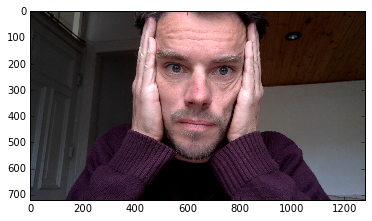

In [22]:
print(movie.shape, movie.min(), movie.max())
plt.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))

Done in  16.907363891601562


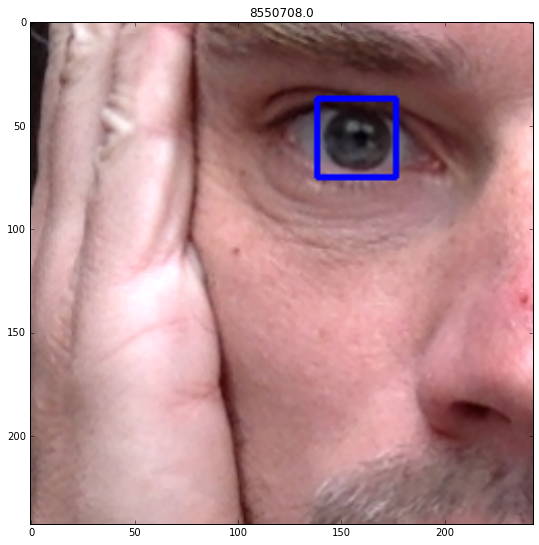

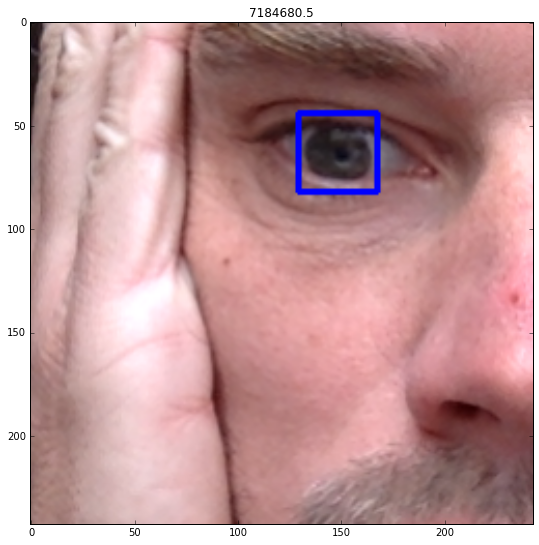

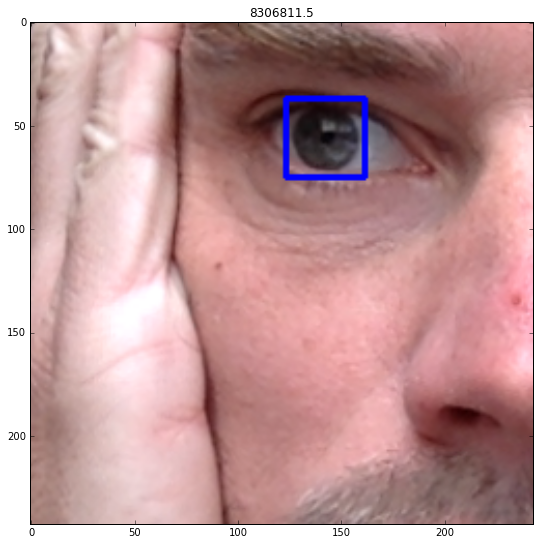

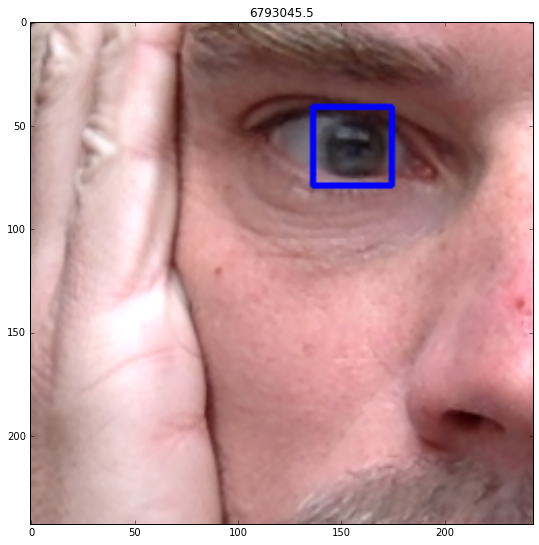

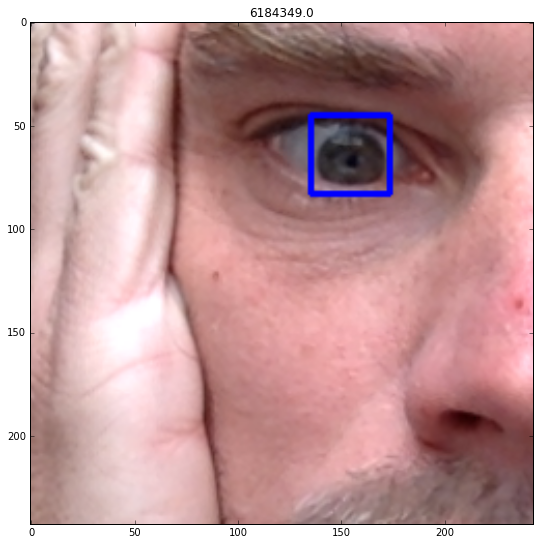

...

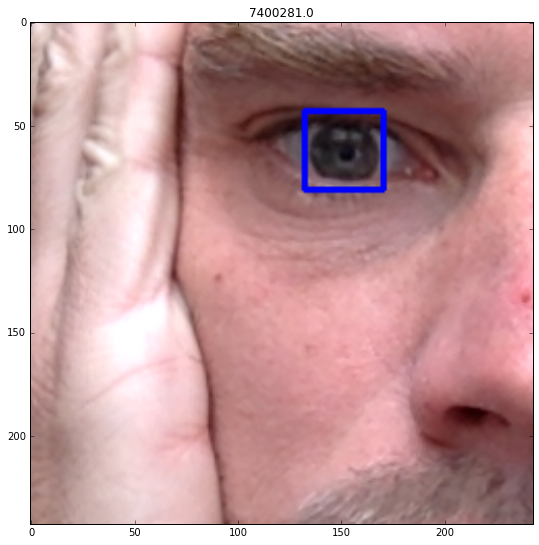

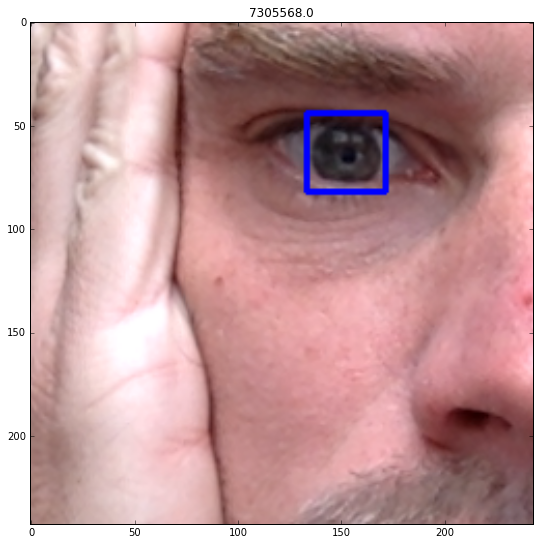

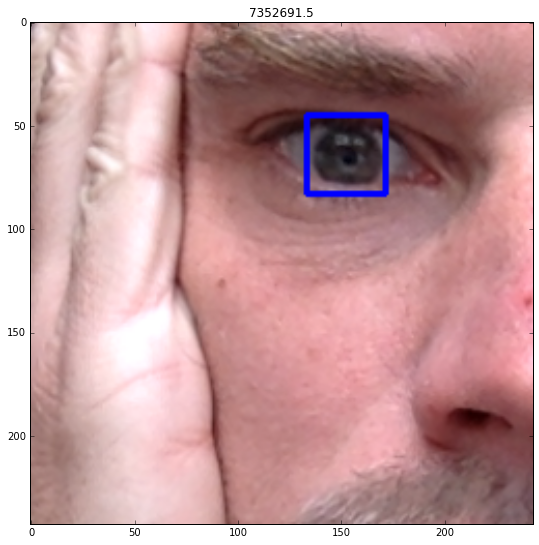

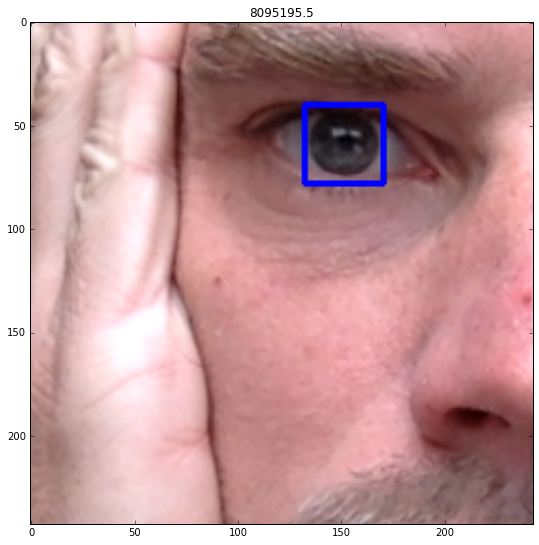

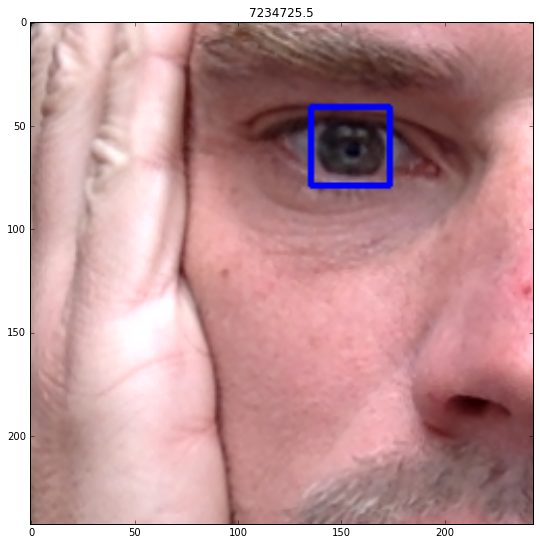

In [23]:
import time
start = time.time()
import cv2
cam.head_size = 486
face_cascade = cv2.CascadeClassifier('/Users/laurentperrinet/pool/libs/vision/opencv/data/haarcascades/haarcascade_frontalface_default.xml')

def get_just_one(image, cascade):
    # We set set minNeighbors=1 then increase it until we have one face only - same for eyes see http://stackoverflow.com/questions/22249579/opencv-detectmultiscale-minneighbors-parameter
    features, minNeighbors = [], 1
    while len(features) == 0 and minNeighbors<20:
        features = cascade.detectMultiScale(image, 1.1, minNeighbors) # image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]
        minNeighbors += 1
        #print(minNeighbors)
    return features[0], minNeighbors

eye_template = cv2.imread('../src/my_eye.png')
template = eye_template.copy()
wt, ht = template.shape[1], template.shape[0]
for i_t in range(N_frame):
    img_ = movie[:, :, :, i_t].copy()
    (x, y, w, h), minNeighbors = get_just_one(img_, face_cascade)
    #print(w, h)
    #img_face = img_[y:y+h, x:x+w]
    half_w, quarter_w = w//2, w//4
    img_face = img_[(y+quarter_w):(y+quarter_w+half_w), x:x+half_w]
    img_face = cv2.resize(img_face, (cam.head_size//2, cam.head_size//2))

    res = cv2.matchTemplate(img_face, template, cv2.TM_CCOEFF)
    #res *= skin_mask[wt/2-1:-wt/2, ht/2-1:-ht/2, 0]

    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    #print(min_val, max_val, min_loc, max_loc)
    bottom_right = (max_loc[0] + wt, max_loc[1] + ht)

    cv2.rectangle(img_face, max_loc, bottom_right, 255, 2)
    if i_t % 4 ==0: 
        fig, axs = plt.subplots(1, 1, figsize=(9, 9))
        axs.imshow(cv2.cvtColor(img_face, cv2.COLOR_BGR2RGB)), axs.set_title(max_val)
    #axs[i].imshow(cv2.cvtColor(track_window, cv2.COLOR_BGR2RGB))
print('Done in ', time.time()-start)

Let's keep the best results and then do the detection again

In [24]:
max_val = np.zeros(N_frame)
for i_t in range(N_frame):
    img_ = movie[:, :, :, i_t].copy()
    (x, y, w, h), minNeighbors = get_just_one(img_, face_cascade)
    half_w, quarter_w = w//2, w//4
    img_face = img_[(y+quarter_w):(y+quarter_w+half_w), x:x+half_w]
    img_face = cv2.resize(img_face, (cam.head_size//2, cam.head_size//2))

    res = cv2.matchTemplate(img_face, template, cv2.TM_CCOEFF)
    min_val, max_val[i_t], min_loc, max_loc = cv2.minMaxLoc(res)

(0.0, 63.0, 5840295.5, 8784989.0)

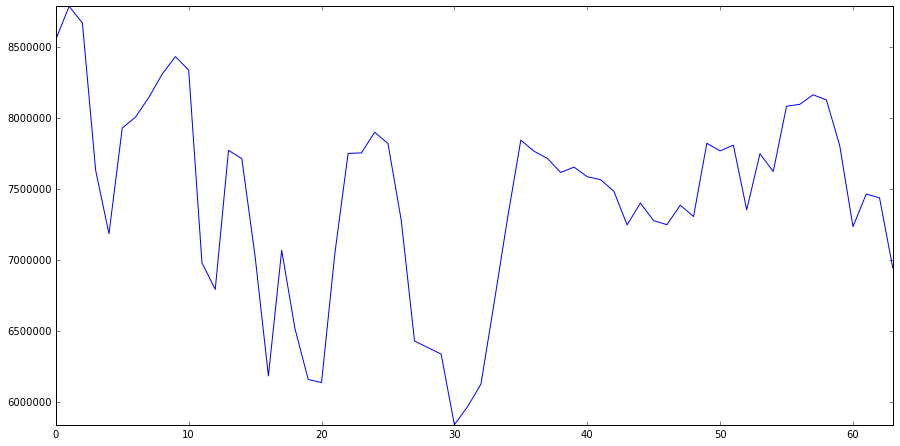

In [25]:
fig, axs = plt.subplots(1, 1, figsize=(15, 7.5))
axs.plot(max_val)
axs.axis('tight')

This build a new "prototypical eye".

0 255 <class 'numpy.uint8'>


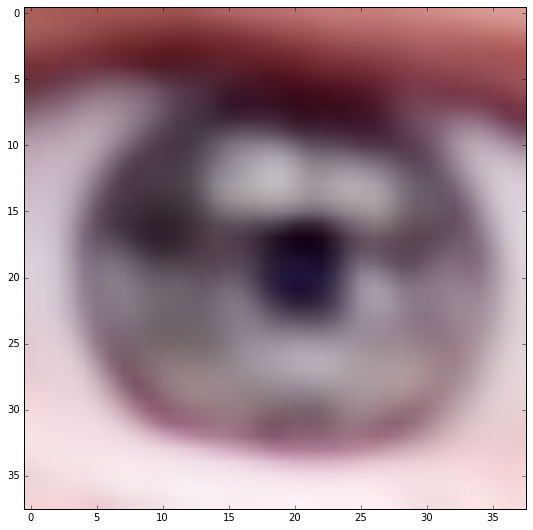

In [26]:
eye_template = np.zeros((template.shape[0], template.shape[1], template.shape[2], N_frame))
for i_t in range(N_frame):
    img_ = movie[:, :, :, i_t].copy()
    (x, y, w, h), minNeighbors = get_just_one(img_, face_cascade)
    half_w, quarter_w = w//2, w//4
    img_face = img_[(y+quarter_w):(y+quarter_w+half_w), x:x+half_w]
    img_face = cv2.resize(img_face, (cam.head_size//2, cam.head_size//2))

    res = cv2.matchTemplate(img_face, template, cv2.TM_CCOEFF)
    min_val, max_val_, min_loc, max_loc = cv2.minMaxLoc(res)
    w, h = template.shape[1], template.shape[0]
    bottom_right = (max_loc[0] + w, max_loc[1] + h)

    weight = (max_val[i_t]-max_val.min())/(max_val.max()-max_val.min())
    #print(weight)
    eye_template[:, :, :, i_t] = weight * img_face[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w].astype(np.float64)
    #print(eye_template.min(), eye_template.max(), type(eye_template[0,0,0]))

    
precision_eye_template = eye_template.std(axis=-1) # get deviation
eye_template = eye_template.sum(axis=-1) # sum over all frames
eye_template -= eye_template.mean()
# some black magic :-) to weight pixels with respect to their precision accross frames
eye_template *= np.exp(-precision_eye_template / (precision_eye_template.mean() * 2.) )

eye_template = (eye_template-eye_template.min())/(eye_template.max()-eye_template.min())*255
eye_template = eye_template.astype(np.uint8)
print(eye_template.min(), eye_template.max(), type(eye_template[0,0,0]))
#print(img_face[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w].min(), img_face[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w].max(), type(eye[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w][0,0,0]))

fig, axs = plt.subplots(1, 1, figsize=(9, 9))
eye_templates.append(eye_template)
axs.imshow(cv2.cvtColor(eye_template, cv2.COLOR_BGR2RGB))

That we may use :

Done in  73.3547728061676


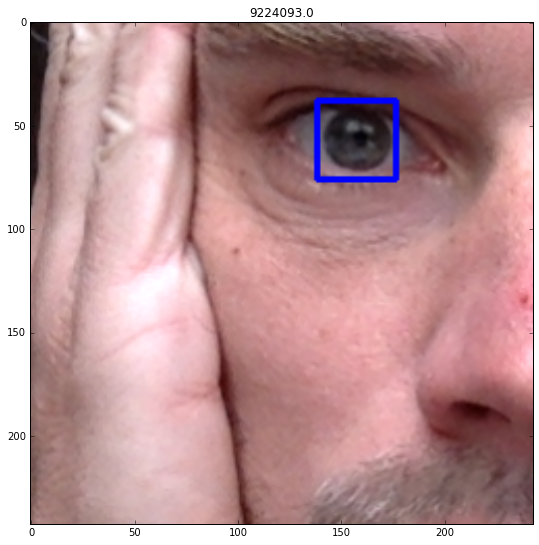

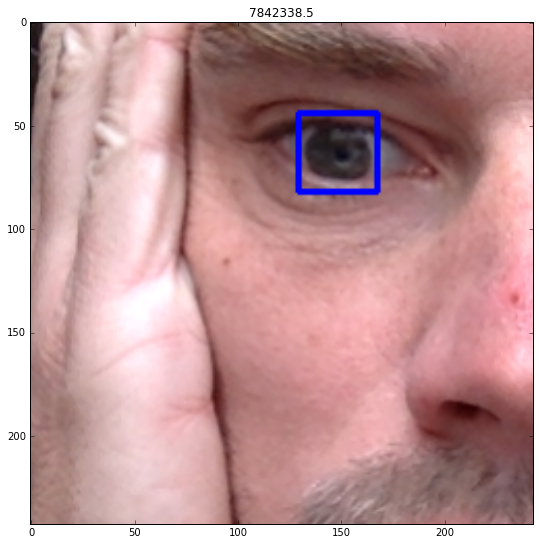

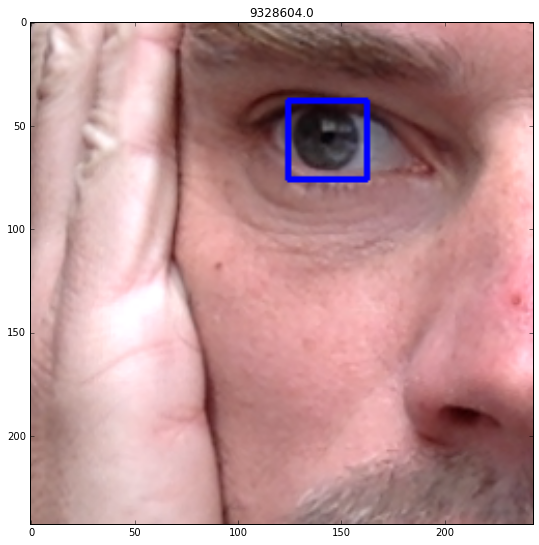

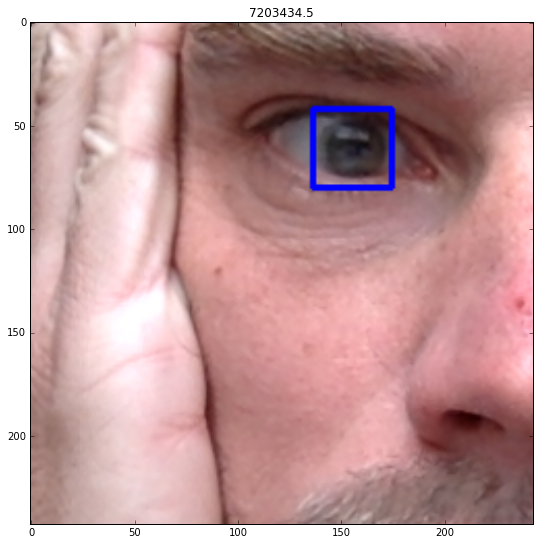

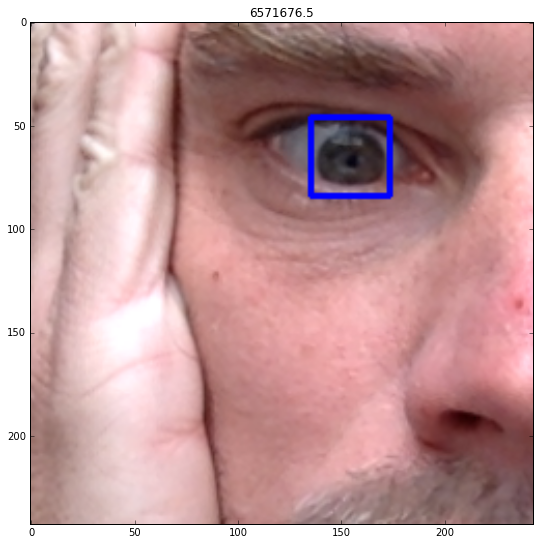

...

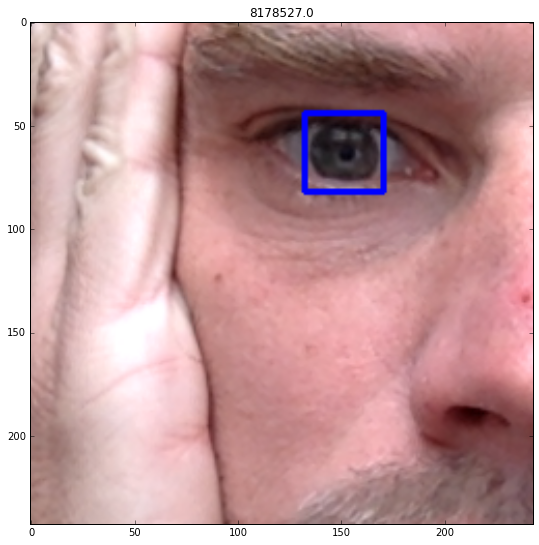

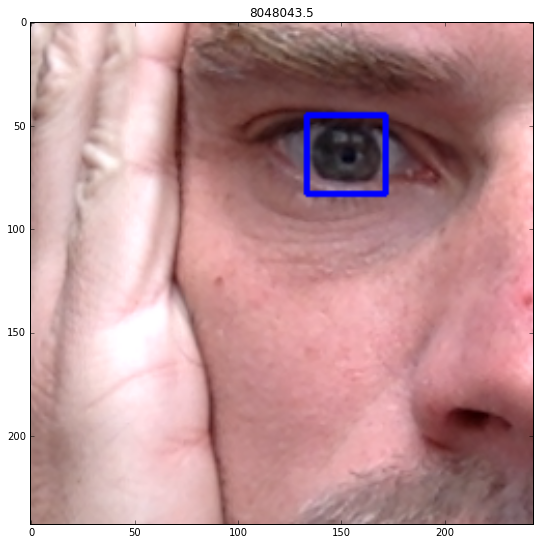

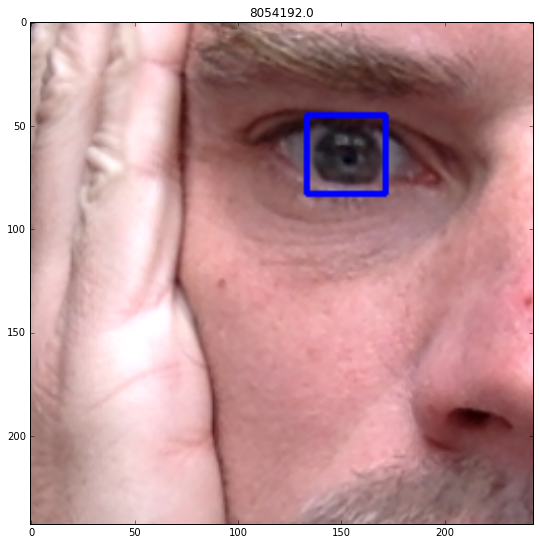

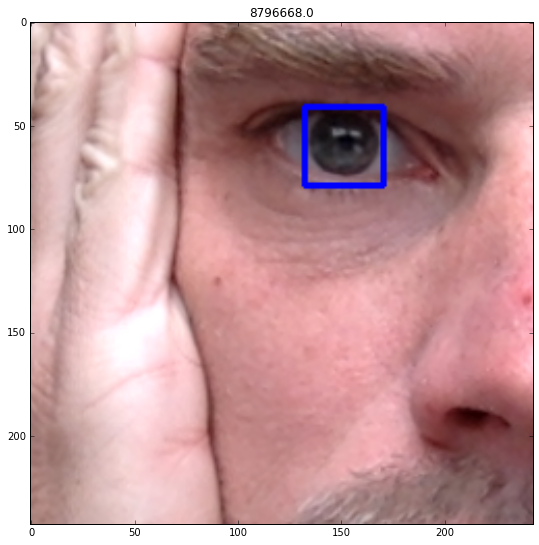

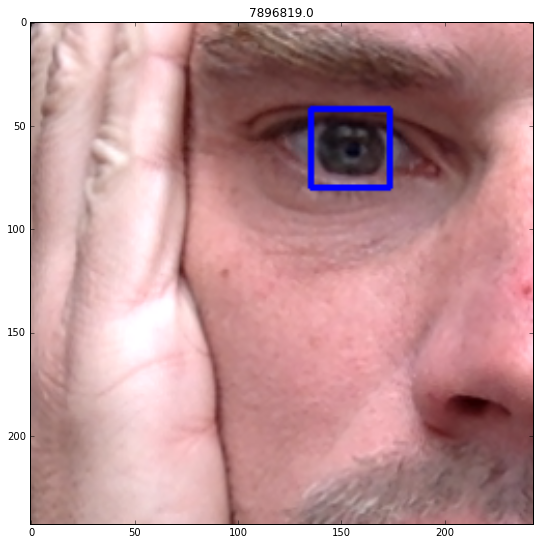

In [27]:
template = eye_template.copy()
wt, ht = template.shape[1], template.shape[0]
for i_t in range(N_frame):
    img_ = movie[:, :, :, i_t].copy()
    (x, y, w, h), minNeighbors = get_just_one(img_, face_cascade)
    #print(w, h)
    #img_face = img_[y:y+h, x:x+w]
    half_w, quarter_w = w//2, w//4
    img_face = img_[(y+quarter_w):(y+quarter_w+half_w), x:x+half_w]
    img_face = cv2.resize(img_face, (cam.head_size//2, cam.head_size//2))

    res = cv2.matchTemplate(img_face, template, cv2.TM_CCOEFF)
    #res *= skin_mask[wt/2-1:-wt/2, ht/2-1:-ht/2, 0]

    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    #print(min_val, max_val, min_loc, max_loc)
    bottom_right = (max_loc[0] + wt, max_loc[1] + ht)

    cv2.rectangle(img_face, max_loc, bottom_right, 255, 2)
    if i_t % 4 ==0: 
        fig, axs = plt.subplots(1, 1, figsize=(9, 9))
        axs.imshow(cv2.cvtColor(img_face, cv2.COLOR_BGR2RGB)), axs.set_title(max_val)
    #axs[i].imshow(cv2.cvtColor(track_window, cv2.COLOR_BGR2RGB))
print('Done in ', time.time()-start)

We can now save it to use again in future detections.

In [28]:
cv2.imwrite('../src/my_eye.png', eye_templates[0])

True